# Machine Unlearning

In [ ]:
# import required libraries
import numpy as np
import tarfile
import os

import torch
from torch import nn
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torchvision.models import resnet18
import torchvision

torch.manual_seed(100)

In [ ]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

def training_step(model, batch):
    images, labels = batch
    images, labels = images.to(device), labels.to(device)
    out = model(images)
    loss = F.cross_entropy(out, labels)
    return loss

def validation_step(model, batch):
    images, labels = batch
    images, labels = images.to(device), labels.to(device)
    out = model(images)
    loss = F.cross_entropy(out, labels)
    acc = accuracy(out, labels)
    return {'Loss': loss.detach(), 'Acc': acc}

def validation_epoch_end(model, outputs):
    batch_losses = [x['Loss'] for x in outputs]
    epoch_loss = torch.stack(batch_losses).mean()
    batch_accs = [x['Acc'] for x in outputs]
    epoch_acc = torch.stack(batch_accs).mean()
    return {'Loss': epoch_loss.item(), 'Acc': epoch_acc.item()}

def epoch_end(model, epoch, result):
    print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
        epoch, result['lrs'][-1], result['train_loss'], result['Loss'], result['Acc']))

def distance(model,model0):
    distance=0
    normalization=0
    for (k, p), (k0, p0) in zip(model.named_parameters(), model0.named_parameters()):
        space='  ' if 'bias' in k else ''
        current_dist=(p.data0-p0.data0).pow(2).sum().item()
        current_norm=p.data0.pow(2).sum().item()
        distance+=current_dist
        normalization+=current_norm
    print(f'Distance: {np.sqrt(distance)}')
    print(f'Normalized Distance: {1.0*np.sqrt(distance/normalization)}')
    return 1.0*np.sqrt(distance/normalization)

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [validation_step(model, batch) for batch in val_loader]
    return validation_epoch_end(model, outputs)

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader,
                  weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)

    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

    for epoch in range(epochs):
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = training_step(model, batch)
            train_losses.append(loss)
            loss.backward()

            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            lrs.append(get_lr(optimizer))


        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        epoch_end(model, epoch, result)
        history.append(result)
        sched.step(result['Loss'])
        if epoch%5==0 and epoch!=0:
          torch.save(model.state_dict(), f"/content/checkpoints/ResNET18_CELEBHQ_{epoch}.pt")
    return history

## Train/Load the Model

In [ ]:
import zipfile
import os

# Define the paths
zip_file_name = '/content/drive/MyDrive/CelebA_HQ_100_identities.zip'
extracted_folder_name = 'CelebA_HQ_100_identities'

# Extract the zip file
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall(extracted_folder_name)

print(f"{zip_file_name} has been successfully extracted to {extracted_folder_name}.")


/content/drive/MyDrive/CelebA_HQ_100_identities.zip has been successfully extracted to CelebA_HQ_100_identities.


In [ ]:
import os

# Look into the data directory
data_dir = '/content/CelebA_HQ_100_identities'
print(os.listdir(data_dir))
classes = os.listdir(data_dir + "/train")
print(classes)

['train', 'test']
['1515', '1584', '1538', '1427', '177', '1052', '1093', '1126', '1837', '1396', '183', '1220', '112', '1330', '1041', '182', '1307', '1370', '1904', '1157', '1133', '1291', '124', '1796', '162', '1440', '1775', '1452', '1930', '181', '1407', '1335', '1285', '1781', '14', '104', '1521', '1060', '175', '1350', '1081', '161', '1109', '1429', '179', '108', '1149', '194', '1256', '195', '1140', '1838', '1079', '1237', '1848', '1280', '1550', '102', '1531', '1269', '1730', '1087', '1800', '1043', '1718', '188', '1317', '116', '1044', '1112', '1047', '1581', '1351', '1823', '146', '1293', '1090', '1158', '1268', '1191', '1435', '158', '143', '1120', '125', '17', '111', '180', '103', '1027', '1262', '1077', '122', '1210', '121', '1595', '1145', '1507', '128', '129']


In [ ]:
transform_train = tt.Compose([
    tt.ToTensor(),
    tt.Resize((224, 224)),
    tt.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = tt.Compose([
    tt.ToTensor(),
    tt.Resize((224, 224)),
    tt.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

In [ ]:
train_ds = ImageFolder(data_dir+'/train', transform_train)
valid_ds = ImageFolder(data_dir+'/test', transform_test)

batch_size = 32
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
valid_dl = DataLoader(valid_ds, batch_size*2, num_workers=2, pin_memory=True)

device = torch.device("cuda")

In [ ]:
from torchvision import datasets, models, transforms
import torch.optim as optim

model = models.resnet18(pretrained=True)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 100) # multi-class classification (num_of_class == 307)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
print('Train dataset size:', len(train_ds))
print('Test dataset size:', len(valid_ds))

class_names = train_ds.classes
print('Class names:', class_names)

Train dataset size: 1381
Test dataset size: 393
Class names: ['102', '1027', '103', '104', '1041', '1043', '1044', '1047', '1052', '1060', '1077', '1079', '108', '1081', '1087', '1090', '1093', '1109', '111', '1112', '112', '1120', '1126', '1133', '1140', '1145', '1149', '1157', '1158', '116', '1191', '121', '1210', '122', '1220', '1237', '124', '125', '1256', '1262', '1268', '1269', '128', '1280', '1285', '129', '1291', '1293', '1307', '1317', '1330', '1335', '1350', '1351', '1370', '1396', '14', '1407', '1427', '1429', '143', '1435', '1440', '1452', '146', '1507', '1515', '1521', '1531', '1538', '1550', '158', '1581', '1584', '1595', '161', '162', '17', '1718', '1730', '175', '177', '1775', '1781', '179', '1796', '180', '1800', '181', '182', '1823', '183', '1837', '1838', '1848', '188', '1904', '1930', '194', '195']


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


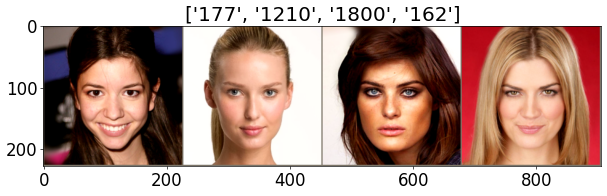

In [ ]:
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})


def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()


# load a batch of train image
iterator = iter(train_dl)

# visualize a batch of train image
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow(out, title=[class_names[x] for x in classes[:4]])

In [ ]:
import time

num_epochs = 15
start_time = time.time()

for epoch in range(num_epochs):
    """ Training Phase """
    model.train()

    running_loss = 0.
    running_corrects = 0

    # load a batch data of images
    for i, (inputs, labels) in enumerate(train_dl):
        inputs = inputs.to(device)
        labels = labels.to(device)

        # forward inputs and get output
        optimizer.zero_grad()
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # get loss value and update the network weights
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_ds)
    epoch_acc = running_corrects / len(train_ds) * 100.
    print('[Train #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc, time.time() - start_time))

    """ Test Phase """
    model.eval()

    with torch.no_grad():
        running_loss = 0.
        running_corrects = 0

        for inputs, labels in valid_dl:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(valid_ds)
        epoch_acc = running_corrects / len(valid_ds) * 100.
        print('[Test #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc, time.time() - start_time))

    if (epoch+1)%5==0 and epoch!=0:
        torch.save(model.state_dict(), f"/content/checkpoints/ResNET18_CELEBHQ_{epoch+1}.pt")

[Train #0] Loss: 4.1118 Acc: 13.2513% Time: 31.0972s
[Test #0] Loss: 3.1170 Acc: 26.9720% Time: 40.6637s
[Train #1] Loss: 1.7779 Acc: 59.5945% Time: 68.0024s
[Test #1] Loss: 2.7164 Acc: 35.3690% Time: 75.2022s
[Train #2] Loss: 0.5931 Acc: 91.0934% Time: 103.0814s
[Test #2] Loss: 1.3848 Acc: 65.3944% Time: 111.7715s
[Train #3] Loss: 0.1691 Acc: 98.6966% Time: 139.8297s
[Test #3] Loss: 1.0618 Acc: 72.7735% Time: 147.5453s
[Train #4] Loss: 0.0652 Acc: 99.5655% Time: 174.4381s
[Test #4] Loss: 0.9285 Acc: 78.8804% Time: 183.9247s
[Train #5] Loss: 0.0502 Acc: 99.3483% Time: 211.8574s
[Test #5] Loss: 0.9669 Acc: 76.0814% Time: 220.5411s
[Train #6] Loss: 0.0267 Acc: 99.9276% Time: 247.8673s
[Test #6] Loss: 0.8501 Acc: 78.3715% Time: 255.3005s
[Train #7] Loss: 0.0209 Acc: 99.9276% Time: 283.2705s
[Test #7] Loss: 0.8455 Acc: 78.1171% Time: 292.4107s
[Train #8] Loss: 0.0123 Acc: 99.9276% Time: 320.8698s
[Test #8] Loss: 0.8287 Acc: 77.0992% Time: 329.5927s
[Train #9] Loss: 0.0104 Acc: 99.9276% Tim

In [ ]:
trained_model_path = f"/content/drive/MyDrive/ResNET18_CELEBHQ_15.pt"
model.load_state_dict(torch.load(trained_model_path))
# history = [evaluate(model, valid_dl)]
# history

<All keys matched successfully>

[Original Image Examples]


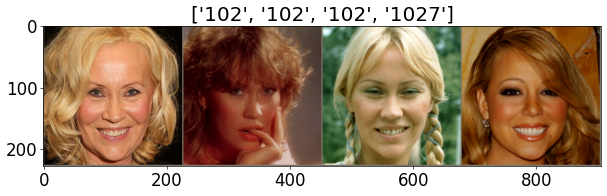

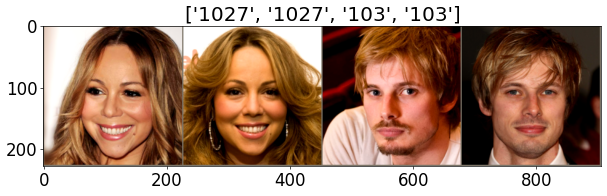

[Prediction Result Examples]


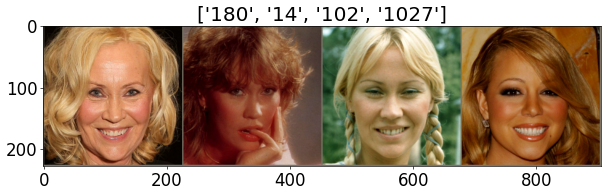

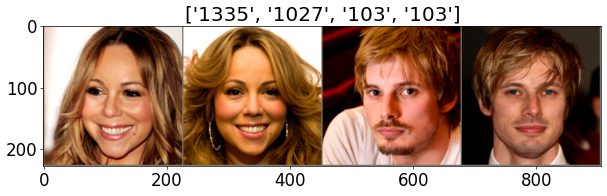

[Test #15] Loss: 47.0581 Acc: 4428.5718% Time: 11.5426s


In [ ]:
import time

model.eval()
start_time = time.time()

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for i, (inputs, labels) in enumerate(valid_dl):
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        if i == 0:
            print('[Original Image Examples]')
            images = torchvision.utils.make_grid(inputs[:4])
            imshow(images.cpu(), title=[class_names[x] for x in labels[:4]])
            images = torchvision.utils.make_grid(inputs[4:8])
            imshow(images.cpu(), title=[class_names[x] for x in labels[4:8]])
            print('[Prediction Result Examples]')
            images = torchvision.utils.make_grid(inputs[:4])
            imshow(images.cpu(), title=[class_names[x] for x in preds[:4]])
            images = torchvision.utils.make_grid(inputs[4:8])
            imshow(images.cpu(), title=[class_names[x] for x in preds[4:8]])

    epoch_loss = running_loss / len(valid_dl)
    epoch_acc = running_corrects / len(valid_dl) * 100.
    print('[Test #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(15, epoch_loss, epoch_acc, time.time() - start_time))

## Grad CAM output for untrained model

In [ ]:
! pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 32.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  U

In [ ]:
# initialize a fresh resnet model
model_untrained = models.resnet18(pretrained=True)
num_features = model_untrained.fc.in_features
model_untrained.fc = nn.Linear(num_features, 100) # multi-class classification (num_of_class == 307)
model_untrained = model_untrained.to(device)

In [ ]:
test_img = torchvision.io.read_image('/content/CelebA_HQ_100_identities/test/102/7755.jpg')
test_img = torchvision.transforms.functional.resize(test_img, (224, 224))

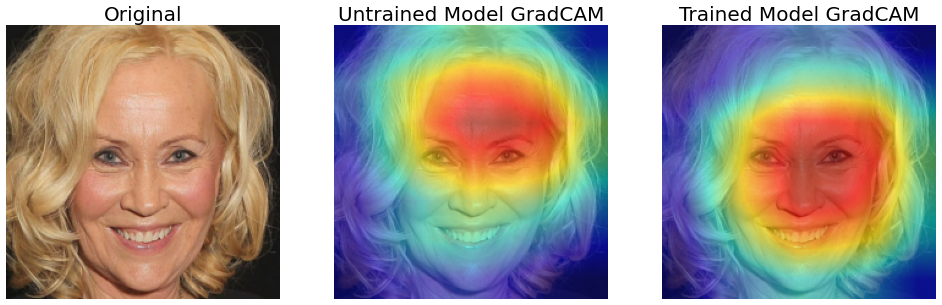

In [ ]:
target_layers = [model.layer4[-1]]
target_layers_untrained = [model_untrained.layer4[-1]]

from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

cam = GradCAM(model=model, target_layers=target_layers)
cam_untrained = GradCAM(model=model_untrained, target_layers=target_layers_untrained)

grayscale_cam = cam(input_tensor=test_img.unsqueeze(0).float(), targets=None)
grayscale_cam = grayscale_cam[0, :]
rgb_img = test_img.permute(1, 2, 0).numpy()
rgb_img = rgb_img / 255
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

grayscale_cam_untrained = cam_untrained(input_tensor=test_img.unsqueeze(0).float(), targets=None)
grayscale_cam_untrained = grayscale_cam_untrained[0, :]
visualization_untrained = show_cam_on_image(rgb_img, grayscale_cam_untrained, use_rgb=True)

# Display visualization with matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 10))
plt.subplot(1, 3, 1)
plt.title('Original')
plt.imshow(rgb_img)
plt.axis('off')
plt.subplot(1, 3, 3)
plt.title('Trained Model GradCAM')
plt.imshow(visualization)
plt.axis('off')
plt.subplot(1, 3, 2)
plt.title('Untrained Model GradCAM')
plt.imshow(visualization_untrained)
plt.axis('off')
plt.show()


## Unlearning

In [ ]:
# defining the noise structure
class Noise(nn.Module):
    def __init__(self, *dim):
        super().__init__()
        self.noise = torch.nn.Parameter(torch.randn(*dim), requires_grad = True)

    def forward(self):
        return self.noise

In [ ]:
class_names = train_ds.classes
# classes

In [ ]:
classes = [i for i in range(100)]

In [ ]:
# classes which are required to un-learn
classes_to_forget = [0,1]

In [ ]:
max_label = float('-inf')  # Initialize with negative infinity

# Assuming train_dl is your DataLoader
for _, labels in train_dl:
    max_label_in_batch = labels.max().item()  # Get the maximum label in the current batch
    if max_label_in_batch > max_label:
        max_label = max_label_in_batch

print("Maximum label value:", max_label)


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Maximum label value: 99


In [ ]:
# classwise list of samples
num_classes = 100
classwise_train = {}
for i in range(num_classes):
    classwise_train[i] = []

for img, label in train_ds:
    classwise_train[label].append((img, label))

classwise_test = {}
for i in range(num_classes):
    classwise_test[i] = []

for img, label in valid_ds:
    classwise_test[label].append((img, label))

In [ ]:
num_classes = 100
classwise_train = {}
for i in range(num_classes):
    classwise_train[i] = []

for imgs, labels in train_dl:
    imgs, labels = imgs.to(device), labels.to(device)
    for img, label in zip(imgs, labels):
        classwise_train[label.item()].append((img.cpu(), label.cpu()))  # Moving tensors to CPU

classwise_test = {}
for i in range(num_classes):
    classwise_test[i] = []

for imgs, labels in valid_dl:
    imgs, labels = imgs.to(device), labels.to(device)
    for img, label in zip(imgs, labels):
        classwise_test[label.item()].append((img.cpu(), label.cpu()))  # Moving tensors to CPU

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [ ]:
# getting some samples from retain classes
num_samples_per_class = 3

retain_samples = []
for i in range(len(classes)):
    if classes[i] not in classes_to_forget:
        retain_samples += classwise_train[i][:num_samples_per_class]


In [ ]:
# retain validation set
# num_classes = 307
retain_valid = []
for cls in range(num_classes):
    if cls not in classes_to_forget:
        for img, label in classwise_test[cls]:
            retain_valid.append((img, label))

# forget validation set
forget_valid = []
for cls in range(num_classes):
    if cls in classes_to_forget:
        for img, label in classwise_test[cls]:
            forget_valid.append((img, label))

forget_valid_dl = DataLoader(forget_valid, batch_size, num_workers=2, pin_memory=True)
retain_valid_dl = DataLoader(retain_valid, batch_size*2, num_workers=2, pin_memory=True)

In [ ]:
# CUDA_LAUNCH_BLOCKING=1
# loading the model
# trained_model_path = f"/content/checkpoints/ResNET18_CELEBHQ_10.pt"
model_trained = resnet18(num_classes = num_classes).to(device = device)
model_trained.load_state_dict(torch.load(trained_model_path))

<All keys matched successfully>

In [ ]:
# Check if CUDA is available
print(torch.cuda.is_available())

True


In [ ]:
for i, (inputs, labels) in enumerate(train_dl):
    inputs = inputs
    labels = labels

    # Print the size of the images tensor
    # print("Image Size: {}".format(inputs[0][0][0].size(0)))  # Print image tensor size
    print(labels[0], labels[1], labels[2], labels[3])
    break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


tensor(70) tensor(61) tensor(24) tensor(90)


In [ ]:
import torch
print(torch.cuda.memory_allocated())

1099877888


In [ ]:
%%time

noises = {}
for cls in classes_to_forget:
    print("Optiming loss for class {}".format(cls))
    noises[cls] = Noise(batch_size, 3, 224, 224).cuda()
    opt = torch.optim.Adam(noises[cls].parameters(), lr = 0.04)
    print("done")
    num_epochs = 20
    num_steps = 10
    class_label = cls
    for epoch in range(num_epochs):
        total_loss = []
        for batch in range(num_steps):
            inputs = noises[cls]()
            labels = torch.zeros(batch_size).cuda()+class_label
            outputs = model(inputs)
            loss = -F.cross_entropy(outputs, labels.long()) + 0.1*torch.mean(torch.sum(torch.square(inputs), [1, 2, 3]))
            opt.zero_grad()
            loss.backward()
            opt.step()
            total_loss.append(loss.cpu().detach().numpy())
        print("Loss: {}".format(np.mean(total_loss)))

Optiming loss for class 0
done
Loss: 11371.65234375
Loss: 5698.5205078125
Loss: 2774.112548828125
Loss: 1338.2835693359375
Loss: 644.98046875
Loss: 311.02056884765625
Loss: 149.6441192626953
Loss: 71.2238540649414
Loss: 32.84904861450195
Loss: 13.922558784484863
Loss: 4.512732028961182
Loss: -0.20103223621845245
Loss: -2.5785813331604004
Loss: -3.7851829528808594
Loss: -4.400942802429199
Loss: -4.71678352355957
Loss: -4.879539489746094
Loss: -4.963767051696777
Loss: -5.0075201988220215
Loss: -5.030320167541504
Optiming loss for class 1
done
Loss: 11387.044921875
Loss: 5708.43798828125
Loss: 2779.656494140625
Loss: 1340.708251953125
Loss: 645.17041015625
Loss: 309.7668151855469
Loss: 147.48631286621094
Loss: 68.49662780761719
Loss: 29.76340103149414
Loss: 10.606695175170898
Loss: 1.044000506401062
Loss: -3.7736594676971436
Loss: -6.2219672203063965
Loss: -7.476056098937988
Loss: -8.122953414916992
Loss: -8.45872974395752
Loss: -8.633976936340332
Loss: -8.72588062286377
Loss: -8.77427291

## Impair Step

In [ ]:
%%time

batch_size = 32
noisy_data = []
num_batches = 20
class_num = 0

for cls in classes_to_forget:
    for i in range(num_batches):
        batch = noises[cls]().cpu().detach()
        for i in range(batch[0].size(0)):
            noisy_data.append((batch[i], torch.tensor(class_num)))

other_samples = []
for i in range(len(retain_samples)):
    other_samples.append((retain_samples[i][0].cpu(), torch.tensor(retain_samples[i][1])))
noisy_data += other_samples
noisy_loader = torch.utils.data.DataLoader(noisy_data, batch_size=32, shuffle = True)


optimizer = torch.optim.Adam(model.parameters(), lr = 0.01)


for epoch in range(10):
    model.train(True)
    running_loss = 0.0
    running_acc = 0
    for i, data in enumerate(noisy_loader):
        inputs, labels = data
        inputs, labels = inputs.cuda(),torch.tensor(labels).cuda()

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = F.cross_entropy(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item() * inputs.size(0)
        out = torch.argmax(outputs.detach(),dim=1)
        assert out.shape==labels.shape
        running_acc += (labels==out).sum().item()
    print(f"Train loss {epoch+1}: {running_loss/len(train_ds)},Train Acc:{running_acc*100/len(train_ds)}%")

<timed exec>:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
<timed exec>:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Train loss 1: 1.6377308201220138,Train Acc:2.896451846488052%
Train loss 2: 1.6106532074074051,Train Acc:3.2585083272990585%
Train loss 3: 1.596075676732267,Train Acc:3.837798696596669%
Train loss 4: 1.5526587881962517,Train Acc:4.127443881245474%
Train loss 5: 1.543575552043321,Train Acc:4.055032585083273%
Train loss 6: 1.5366440606583383,Train Acc:4.127443881245474%
Train loss 7: 1.5130512595263017,Train Acc:4.634322954380884%
Train loss 8: 1.503324936819111,Train Acc:4.1998551774076756%
Train loss 9: 1.472822361973038,Train Acc:4.1998551774076756%
Train loss 10: 1.447564814247833,Train Acc:4.634322954380884%
CPU times: user 12.6 s, sys: 350 ms, total: 12.9 s
Wall time: 13.1 s


In [ ]:
print("Performance of Standard Forget Model on Forget Class")
history = [evaluate(model, forget_valid_dl)]
print("Accuracy: {}".format(history[0]["Acc"]*100))
print("Loss: {}".format(history[0]["Loss"]))

print("Performance of Standard Forget Model on Retain Class")
history = [evaluate(model, retain_valid_dl)]
print("Accuracy: {}".format(history[0]["Acc"]*100))
print("Loss: {}".format(history[0]["Loss"]))

Performance of Standard Forget Model on Forget Class
Accuracy: 0.0
Loss: 10.037154197692871
Performance of Standard Forget Model on Retain Class
Accuracy: 1.785714365541935
Loss: 5.448526859283447


## Repair Step

In [ ]:
%%time

heal_loader = torch.utils.data.DataLoader(other_samples, batch_size=32, shuffle = True)

optimizer = torch.optim.Adam(model.parameters(), lr = 0.05)


for epoch in range(10):
    model.train(True)
    running_loss = 0.0
    running_acc = 0
    for i, data in enumerate(heal_loader):
        inputs, labels = data
        inputs, labels = inputs.cuda(),torch.tensor(labels).cuda()

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = F.cross_entropy(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item() * inputs.size(0)
        out = torch.argmax(outputs.detach(),dim=1)
        assert out.shape==labels.shape
        running_acc += (labels==out).sum().item()
    print(f"Train loss {epoch+1}: {running_loss/len(train_ds)},Train Acc:{running_acc*100/len(train_ds)}%")

<timed exec>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


Train loss 1: 0.7691420383163331,Train Acc:2.8240405503258508%
Train loss 2: 0.741910072964745,Train Acc:2.896451846488052%
Train loss 3: 0.7394899562335722,Train Acc:3.9826212889210715%
Train loss 4: 0.7448097093652591,Train Acc:4.5619116582186825%
Train loss 5: 0.7201857722211281,Train Acc:4.127443881245474%
Train loss 6: 0.7189822977302214,Train Acc:4.634322954380884%
Train loss 7: 0.731345825830635,Train Acc:4.851556842867487%
Train loss 8: 0.7098479001613565,Train Acc:4.9239681390296886%
Train loss 9: 0.705039204936542,Train Acc:5.430847212165098%
Train loss 10: 0.6871770683360393,Train Acc:5.865314989138305%
CPU times: user 8.93 s, sys: 64.7 ms, total: 9 s
Wall time: 9.06 s


In [ ]:
print("Performance of Standard Forget Model on Forget Class")
history = [evaluate(model, forget_valid_dl)]
print("Accuracy: {}".format(history[0]["Acc"]*100))
print("Loss: {}".format(history[0]["Loss"]))

print("Performance of Standard Forget Model on Retain Class")
history = [evaluate(model, retain_valid_dl)]
print("Accuracy: {}".format(history[0]["Acc"]*100))
print("Loss: {}".format(history[0]["Loss"]))

Performance of Standard Forget Model on Forget Class
Accuracy: 0.0
Loss: 12.829262733459473
Performance of Standard Forget Model on Retain Class
Accuracy: 2.008928544819355
Loss: 6.895003318786621


In [ ]:
import os
import torchvision
from PIL import Image

def get_first_image_from_subfolders(main_folder):
    image_list = []
    # Iterate through each subfolder in the main folder
    for root, dirs, files in os.walk(main_folder):
        # Check if the folder contains any files
        if files:
            # Filter for image files (you can adjust this condition if needed)
            image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]
            if image_files:
                # Grab the first image file
                first_image_path = os.path.join(root, image_files[0])
                image_list.append(torchvision.io.read_image(first_image_path))
                # If you just want the path, you can append `first_image_path` instead of `image`
    return image_list

# Example usage:
main_folder = '/content/CelebA_HQ_100_identities/test'
test_imgs = get_first_image_from_subfolders(main_folder)


In [ ]:

def grad_cam_output(test_img) :
    test_img = torchvision.transforms.functional.resize(test_img, (224, 224))
    target_layers_trained = [model_trained.layer4[-1]]
    target_layers_untrained = [model_untrained.layer4[-1]]
    target_layers_unlearned = [model.layer4[-1]]

    from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
    from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
    from pytorch_grad_cam.utils.image import show_cam_on_image

    cam_trained = GradCAM(model=model_trained, target_layers=target_layers_trained)
    cam_untrained = GradCAM(model=model_untrained, target_layers=target_layers_untrained)
    cam_unlearned = GradCAM(model=model, target_layers=target_layers_unlearned)


    grayscale_cam_trained = cam_trained(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_trained = grayscale_cam_trained[0, :]
    rgb_img = test_img.permute(1, 2, 0).numpy()
    rgb_img = rgb_img / 255
    visualization_trained = show_cam_on_image(rgb_img, grayscale_cam_trained, use_rgb=True)

    grayscale_cam_untrained = cam_untrained(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_untrained = grayscale_cam_untrained[0, :]
    visualization_untrained = show_cam_on_image(rgb_img, grayscale_cam_untrained, use_rgb=True)

    grayscale_cam_unlearned = cam_unlearned(input_tensor=test_img.unsqueeze(0).float(), targets=None)
    grayscale_cam_unlearned = grayscale_cam_unlearned[0, :]
    visualization_unlearned = show_cam_on_image(rgb_img, grayscale_cam_unlearned, use_rgb=True)

    # Display visualization with matplotlib
    import matplotlib.pyplot as plt
    plt.figure(figsize=(25, 10))
    plt.subplot(1, 4, 1)
    plt.title('Original')
    plt.imshow(rgb_img)
    plt.axis('off')
    plt.subplot(1, 4, 3)
    plt.title('Trained Model GradCAM')
    plt.imshow(visualization_trained)
    plt.axis('off')
    plt.subplot(1, 4, 2)
    plt.title('Untrained Model GradCAM')
    plt.imshow(visualization_untrained)
    plt.axis('off')
    plt.subplot(1, 4, 4)
    plt.title('Unlearned Model GradCAM')
    plt.imshow(visualization_unlearned)
    plt.axis('off')
    plt.show()


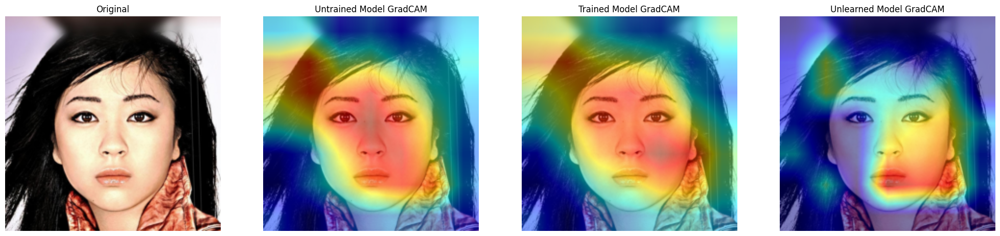

In [ ]:
grad_cam_output(test_imgs[0])

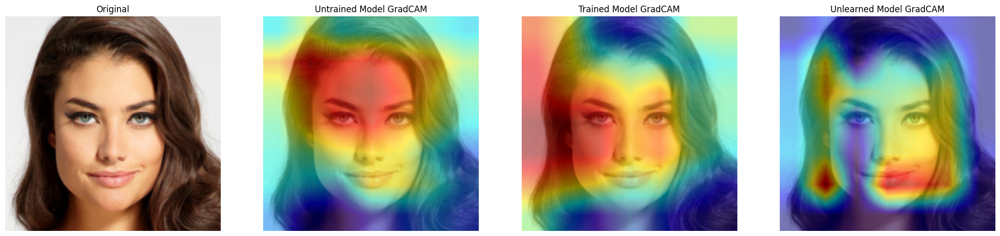

In [ ]:
grad_cam_output(test_imgs[1])

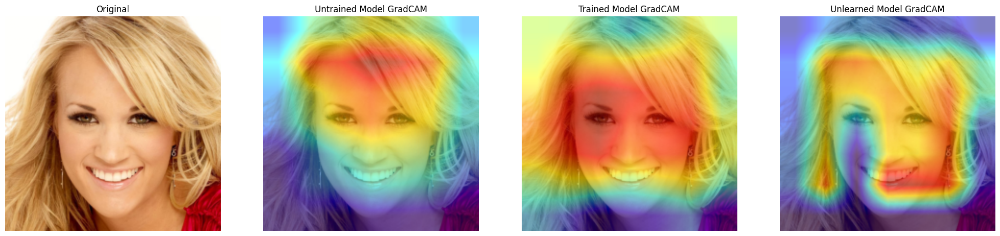

In [ ]:
grad_cam_output(test_imgs[2])

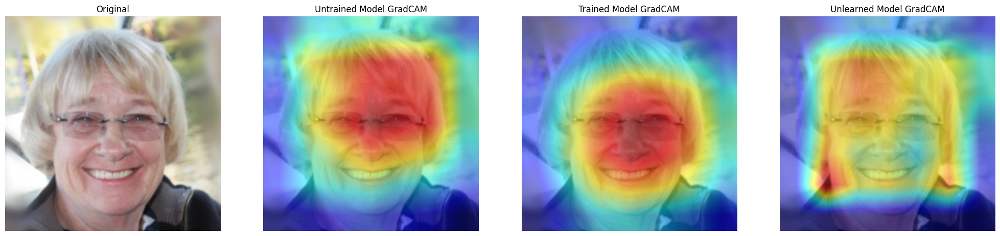

In [ ]:
grad_cam_output(test_imgs[3])

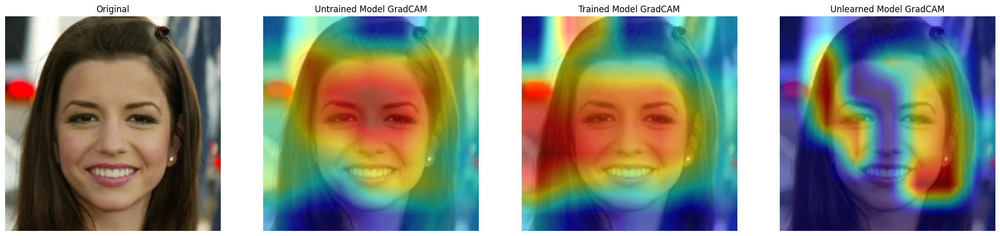

In [ ]:
grad_cam_output(test_imgs[4])

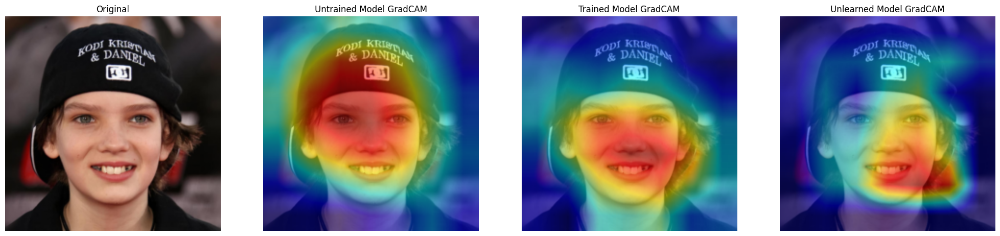

In [ ]:
grad_cam_output(test_imgs[5])

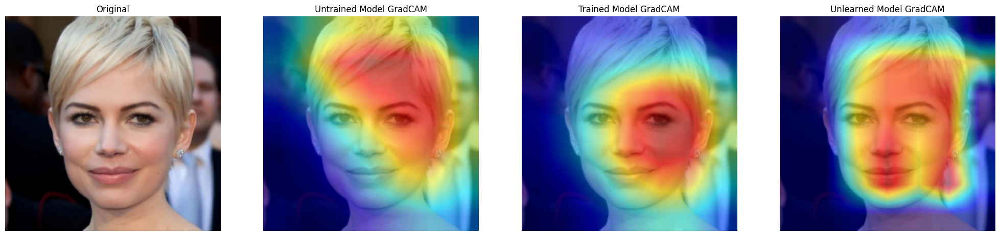

In [ ]:
grad_cam_output(test_imgs[6])

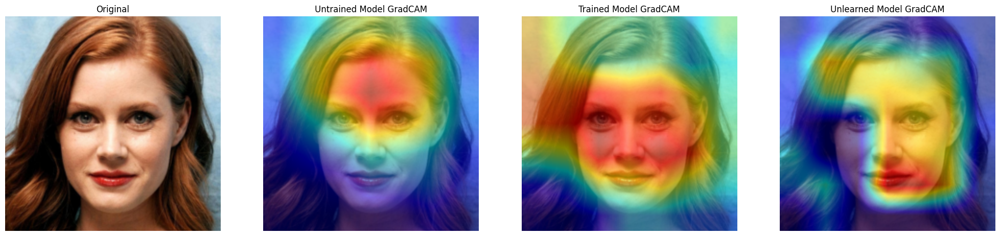

In [ ]:
grad_cam_output(test_imgs[32])